# Utils

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np 

from matplotlib import pyplot as plt
import seaborn as sns

from data import load_data
from dimred import fit_PCA, fit_UMAP, fit_HUMAP, fit_PMAP

In [3]:
def plot_2D(data, dataset_name, data_subset_name, 
            labels_name, n_labels_to_keep, methods, n_rows, n_cols,
            coldict=None, col_palette=plt.get_cmap("tab10"), alpha=1.0,
            d1=4.5, d2=4.0, fontsize=9, markersize=20, bbox=(1.3, 0.7),
            legend=True, leg_markersize_multiplier = 1.0, leg_fontsize_multiplier = 1.0,
            save_name=None):    

    plt.rcParams["figure.dpi"] = 150

    if dataset_name == "L1000FWD":
        labels = data[dataset_name][data_subset_name]["metadata"][labels_name].values
        if labels_name == "Time":
            labels_order = np.array(["24.0", "6.0", "48.0"]).astype(str)
        elif labels_name == "Phase":
            labels_order = np.array(["Withdrawn", "Launched", "Phase 1", "Preclinical", "Phase 3", "Phase 2", "Phase 1/Phase 2", "unknown", "Phase 2/Phase 3"]).astype(str)
        elif labels_name == "Perturbation":
            labels_order = None
            #labels_order = np.array(["tretinoin", "doxorubicin", "withaferin-a", "digoxin", "wortmannin", "ouabain", "emetine", "15-delta-prostaglandin-j2", "dexamethasone", "radicicol", "cycloheximide", "parthenolide", "forskolin", "manumycin-a", "cyclosporin-a", "other", "NSC-632839", "trichostatin-a", "brefeldin-a", "daunorubicin"]).astype(str)
        elif labels_name == "Cell":
            labels_order = np.array(["PC3", "A375", "A549", "MCF7", "VCAP", "HEPG2", "HT29", "HCC515", "ASC", "HA1E", "SKB", "NPC", "BT20", "SKBR3", "HCC15", "other", "PHH", "MCF10A", "MDAMB231", "HS578T"]).astype(str)
        elif labels_name == "MOA":
            labels_order = np.array(["protein synthesis inhibitor", "dopamine receptor antagonist", "NFkB pathway inhibitor", "topoisomerase inhibitor", "HDAC inhibitor", "ATPase inhibitor", "HMGCR inhibitor", "PI3K inhibitor", "tubulin polymerization inhibitor", "HSP inhibitor", "mTOR inhibitor", "adrenergic receptor antagonist", "MEK inhibitor", "EGFR inhibitor", "other", "unknown", "retinoid receptor agonist", "glucocorticoid receptor agonist", "CDK inhibitor", "adrenergic receptor agonist"]).astype(str)
    elif dataset_name == "SigComLINCS":
        labels = data[dataset_name][data_subset_name ]["metadata"][labels_name].values.astype(str)
        labels[np.where(labels == "nan")] = "unknown"
        labels_order = None

    unique, counts = np.unique(labels, return_counts = True)
    labels_to_keep = unique[np.argsort(counts)[::-1]][:n_labels_to_keep]
    labels = np.array([l if l in labels_to_keep else "other" for l in labels]).astype(str)

    _, _ = plt.subplots(n_rows, n_cols, figsize=(d1*n_cols, d2*n_rows))

    for i, method in enumerate(methods):
        ax = plt.subplot(n_rows, n_cols, i+1)
        ax.set_title(" ".join(methods[i].split('_')), fontsize=fontsize)

        df = pd.DataFrame(data[dataset_name][data_subset_name]["embeddings"][method], columns=['pm1', 'pm2'])
        if not (labels is None):
            df[labels_name] = labels
            if labels_order is None:
                labels_order = np.unique(labels)  
            if coldict is None:
                coldict = dict(zip(labels_order, col_palette(np.arange(len(labels)))))
            sns.scatterplot(x="pm1", y="pm2", hue=labels_name, 
                            hue_order=labels_order,
                            palette=coldict,
                            alpha=alpha, edgecolor="none",
                            data=df, ax=ax, s=markersize)

        else:
            sns.scatterplot(x="pm1", y="pm2", data=df, ax=ax, s=markersize)

        ax.legend_.remove()
        ax.axis('off')
        ax.axis('equal') 
  
    if legend:
        legend_handles, legend_labels = ax.get_legend_handles_labels()

    if len(methods) < n_rows * n_cols:
        for i in range(len(methods), n_rows * n_cols):
            ax = plt.subplot(n_rows, n_cols, i+1)
            ax.axis('off')
            ax.axis('equal')
            
    if legend:
        ax.legend(legend_handles, legend_labels, loc='center',
                  fontsize=fontsize*leg_fontsize_multiplier, bbox_to_anchor=bbox, markerscale=leg_markersize_multiplier, facecolor='white')

    plt.tight_layout()

    if save_name:
        plt.savefig(save_name, bbox_inches = 'tight')

    plt.show()

# Get 2D embeddings

In [ ]:
data = load_data("data/L1000FWD/", "data/SigComLINCS/")

save = False
load = True

In [4]:
def fit_UMAP_5(embeds, dimension):
    return fit_UMAP(embeds, dimension, n_neighbors=5)
def fit_UMAP_50(embeds, dimension):
    return fit_UMAP(embeds, dimension, n_neighbors=50)
def fit_UMAP_250(embeds, dimension):
    return fit_UMAP(embeds, dimension, n_neighbors=250)

def fit_HUMAP_5(embeds, dimension):
    return fit_HUMAP(embeds, dimension, n_neighbors=5)
def fit_HUMAP_50(embeds, dimension):
    return fit_HUMAP(embeds, dimension, n_neighbors=50)
def fit_HUMAP_250(embeds, dimension):
    return fit_HUMAP(embeds, dimension, n_neighbors=250)

def fit_PMAP_5(embeds, dimension):
    return fit_PMAP(embeds, dimension, n_neighbors=5)
def fit_PMAP_50(embeds, dimension):
    return fit_PMAP(embeds, dimension, n_neighbors=50)
def fit_PMAP_250(embeds, dimension):
    return fit_PMAP(embeds, dimension, n_neighbors=250)

dimred_methods = {
    "PCA": fit_PCA,
    "UMAP_5": fit_UMAP_5,
    "UMAP_50": fit_UMAP_50,
    "UMAP_250": fit_UMAP_250,
    "HUMAP_5": fit_HUMAP_5,
    "HUMAP_50": fit_HUMAP_50,
    "HUMAP_250": fit_HUMAP_250,
    "PMAP_5": fit_PMAP_5,
    "PMAP_50": fit_PMAP_50,
    "PMAP_250": fit_PMAP_250,
}

In [5]:
dataset_name = "L1000FWD"
data_subset_name = "landmark"

data[dataset_name][data_subset_name]["embeddings"] = {}
data[dataset_name][data_subset_name]["embeddings"]["FWD"] = data[dataset_name][data_subset_name]["metadata"][["x", "y"]].values
for method in dimred_methods.keys():
    if load:
        embeddings = np.load("results/" + dataset_name + "/" + data_subset_name + "_2D_" + method + ".npy")
    else:
        print(method)
        embeddings = dimred_methods[method](data[dataset_name][data_subset_name]["signatures"], 2)
        if save:
            np.save("results/" + dataset_name + "/" + data_subset_name + "_2D_" + method + ".npy", embeddings)
    data[dataset_name][data_subset_name]["embeddings"][method] = embeddings

In [6]:
dataset_name = "SigComLINCS"

for data_subset_name in ["A375", "HELA", "NEU", "NPC"]:
    data[dataset_name][data_subset_name]["embeddings"] = {}
    for method in dimred_methods.keys():
        if load:
            embeddings = np.load("results/" + dataset_name + "/" + data_subset_name + "_2D_" + method + ".npy")
        else:
            print(data_subset_name + "\t" + method)
            embeddings = dimred_methods[method](data[dataset_name][data_subset_name]["signatures"], 2)
            if save:
                np.save("results/" + dataset_name + "/" + data_subset_name + "_2D_" + method + ".npy", embeddings)
        data[dataset_name][data_subset_name]["embeddings"][method] = embeddings

# Visualize 2D embeddings

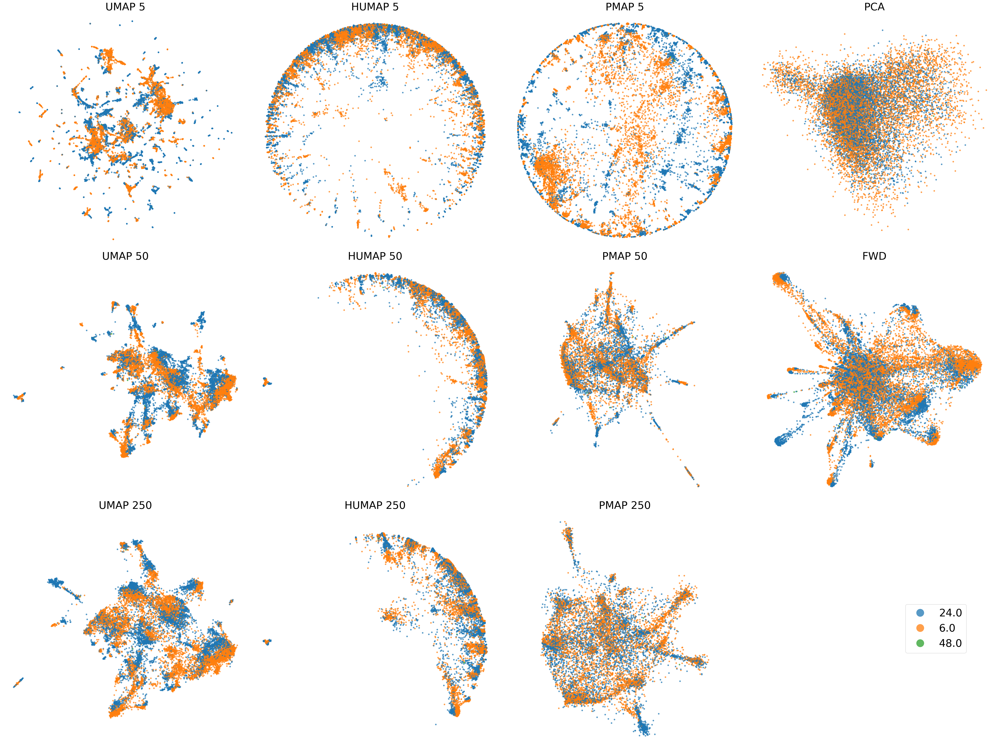

In [ ]:
dataset_name = "L1000FWD"
data_subset_name = "landmark"

#labels_name = "Time"
#labels_name = "Dose"
#labels_name = "Phase"
#labels_name = "Perturbation"
labels_name = "Cell"
#labels_name = "MOA"

save_name = dataset_name + "_" + data_subset_name + "_" + labels_name + "_2D.png"

n_labels_to_keep = 19
col_palette = plt.get_cmap("tab20")
#col_palette = plt.get_cmap("tab10")

methods = ["UMAP_5", "HUMAP_5", "PMAP_5", "PCA", "UMAP_50", "HUMAP_50", "PMAP_50", "FWD", "UMAP_250", "HUMAP_250", "PMAP_250"]

plot_2D(data = data, dataset_name = dataset_name, data_subset_name = data_subset_name,
        labels_name = labels_name, n_labels_to_keep = n_labels_to_keep,
        methods = methods, n_rows = 3, n_cols = 4,
        coldict = None, col_palette = col_palette, alpha = 0.75,
        d1 = 10, d2 = 10, fontsize = 30, markersize = 20, bbox = (0.75, 0.5),
        legend = True, leg_markersize_multiplier = 3.0, leg_fontsize_multiplier = 0.7,
        save_name = save_name) 

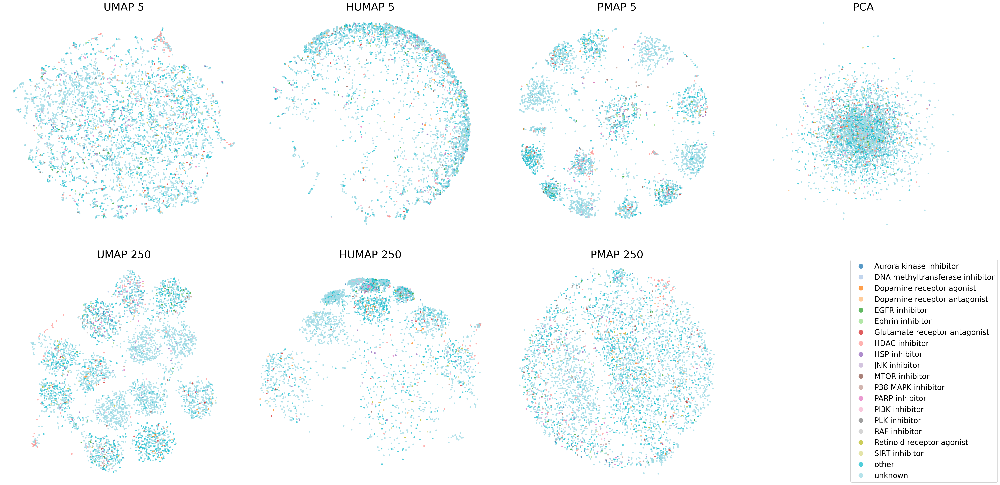

In [66]:
dataset_name = "SigComLINCS"
data_subset_name = "NEU" 
#data_subset_name = "NPC"
#data_subset_name = "HELA"
#data_subset_name = "A375"

#labels_name = "Time"
#labels_name = "Dose"
#labels_name = "Phase"
#labels_name = "Perturbation"
#labels_name = "Cell"
labels_name = "MOA"

save_name = dataset_name + "_" + data_subset_name + "_" + labels_name + "_2D.png"

n_labels_to_keep = 19
col_palette = plt.get_cmap("tab20")
#col_palette = plt.get_cmap("tab10")

methods = ["UMAP_5", "HUMAP_5", "PMAP_5", "PCA", "UMAP_250", "HUMAP_250", "PMAP_250"]

plot_2D(data = data, dataset_name = dataset_name, data_subset_name = data_subset_name,
        labels_name = labels_name, n_labels_to_keep = n_labels_to_keep,
        methods = methods, n_rows = 2, n_cols = 4,
        coldict=None, col_palette=col_palette, alpha=0.75,
        d1=10, d2=10, fontsize=30, markersize=20, bbox=(0.75, 0.5),
        legend=True, leg_markersize_multiplier = 3.0, leg_fontsize_multiplier = 0.7,
        save_name=save_name) 